In [1]:
from skimage import img_as_float, img_as_uint
from skimage import io 
from glob import glob
from skimage import transform, filters
import os
from lsm_utils import process_pmm_datasets, screen_background
from pycromanager import Dataset as PDataset
from os import path
import random
from skimage.filters import threshold_otsu, threshold_triangle, threshold_yen
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm


In [3]:
process_pmm_datasets('pmm_datasets/PA2081b_part2_clean', 'datasets/PA_2081b_part2/target')

  0%|          | 0/65 [00:00<?, ?it/s]

Dataset opened                 


  2%|▏         | 1/65 [00:26<28:40, 26.88s/it]

Dataset opened                 


  3%|▎         | 2/65 [00:57<30:50, 29.37s/it]

Dataset opened                 


  5%|▍         | 3/65 [01:23<28:23, 27.47s/it]

Dataset opened                 


  6%|▌         | 4/65 [01:49<27:21, 26.90s/it]

Dataset opened                 


  8%|▊         | 5/65 [02:16<27:00, 27.01s/it]

Dataset opened                 


  9%|▉         | 6/65 [02:45<27:09, 27.62s/it]

Dataset opened                 


 11%|█         | 7/65 [03:34<33:27, 34.61s/it]

Dataset opened                 


 12%|█▏        | 8/65 [04:02<30:50, 32.46s/it]

Dataset opened                 


 14%|█▍        | 9/65 [04:31<29:22, 31.46s/it]

Dataset opened                 


 15%|█▌        | 10/65 [05:02<28:36, 31.21s/it]

Dataset opened                 


 17%|█▋        | 11/65 [05:33<28:08, 31.28s/it]

Dataset opened                 


 18%|█▊        | 12/65 [06:24<32:55, 37.27s/it]

Dataset opened                 


 20%|██        | 13/65 [07:21<37:27, 43.23s/it]

Dataset opened                 


 22%|██▏       | 14/65 [07:48<32:32, 38.28s/it]

Dataset opened                 


 23%|██▎       | 15/65 [08:19<30:10, 36.21s/it]

Dataset opened                 


 25%|██▍       | 16/65 [08:47<27:36, 33.81s/it]

Dataset opened                 


 26%|██▌       | 17/65 [09:18<26:15, 32.83s/it]

Dataset opened                 


 28%|██▊       | 18/65 [11:36<50:27, 64.41s/it]

Dataset opened                 


 29%|██▉       | 19/65 [12:09<42:07, 54.94s/it]

Dataset opened                 


 31%|███       | 20/65 [12:42<36:13, 48.31s/it]

Dataset opened                 


 32%|███▏      | 21/65 [13:08<30:33, 41.68s/it]

Dataset opened                 


 34%|███▍      | 22/65 [13:34<26:37, 37.16s/it]

Dataset opened                 


 35%|███▌      | 23/65 [14:00<23:29, 33.55s/it]

Dataset opened                 


 37%|███▋      | 24/65 [14:25<21:16, 31.13s/it]

Dataset opened                 


 38%|███▊      | 25/65 [15:17<24:54, 37.36s/it]

Dataset opened                 


 40%|████      | 26/65 [15:42<21:54, 33.71s/it]

Dataset opened                 


 42%|████▏     | 27/65 [16:08<19:49, 31.30s/it]

Dataset opened                 


 43%|████▎     | 28/65 [16:32<17:59, 29.18s/it]

Dataset opened                 


 45%|████▍     | 29/65 [17:05<18:07, 30.21s/it]

Dataset opened                 


 46%|████▌     | 30/65 [17:37<17:58, 30.82s/it]

Dataset opened                 


 48%|████▊     | 31/65 [18:02<16:28, 29.07s/it]

Dataset opened                 


 49%|████▉     | 32/65 [18:46<18:31, 33.67s/it]

Dataset opened                 


 51%|█████     | 33/65 [19:09<16:16, 30.52s/it]

Dataset opened                 


 52%|█████▏    | 34/65 [19:32<14:28, 28.01s/it]

Dataset opened                 


 54%|█████▍    | 35/65 [19:55<13:23, 26.77s/it]

Dataset opened                 


 55%|█████▌    | 36/65 [20:18<12:16, 25.41s/it]

Dataset opened                 


 57%|█████▋    | 37/65 [20:38<11:06, 23.81s/it]

Dataset opened                 


 58%|█████▊    | 38/65 [20:57<10:09, 22.56s/it]

Dataset opened                 


 60%|██████    | 39/65 [21:15<09:11, 21.20s/it]

Dataset opened                 


 62%|██████▏   | 40/65 [21:32<08:16, 19.86s/it]

Dataset opened                 


 63%|██████▎   | 41/65 [21:59<08:47, 22.00s/it]

Dataset opened                 


 65%|██████▍   | 42/65 [22:43<10:56, 28.55s/it]

Dataset opened                 


 66%|██████▌   | 43/65 [23:37<13:15, 36.18s/it]

Dataset opened                 


 68%|██████▊   | 44/65 [24:02<11:30, 32.86s/it]

Dataset opened                 


 69%|██████▉   | 45/65 [24:32<10:38, 31.91s/it]

Dataset opened                 


 71%|███████   | 46/65 [25:07<10:26, 32.99s/it]

Dataset opened                 


 72%|███████▏  | 47/65 [25:40<09:53, 32.95s/it]

Dataset opened                 


 74%|███████▍  | 48/65 [26:08<08:56, 31.56s/it]

Dataset opened                 


 75%|███████▌  | 49/65 [26:56<09:41, 36.34s/it]

Dataset opened                 


 77%|███████▋  | 50/65 [28:05<11:32, 46.14s/it]

Dataset opened                 


 78%|███████▊  | 51/65 [28:28<09:09, 39.25s/it]

Dataset opened                 


 80%|████████  | 52/65 [29:04<08:16, 38.23s/it]

Dataset opened                 


 82%|████████▏ | 53/65 [29:27<06:42, 33.55s/it]

Dataset opened                 


 83%|████████▎ | 54/65 [29:53<05:45, 31.41s/it]

Dataset opened                 


 85%|████████▍ | 55/65 [30:21<05:04, 30.50s/it]

Dataset opened                 


 86%|████████▌ | 56/65 [31:08<05:16, 35.21s/it]

Dataset opened                 


 88%|████████▊ | 57/65 [31:57<05:16, 39.52s/it]

Dataset opened                 


 89%|████████▉ | 58/65 [32:28<04:18, 36.87s/it]

Dataset opened                 


 91%|█████████ | 59/65 [33:14<03:58, 39.75s/it]

Dataset opened                 


 92%|█████████▏| 60/65 [33:39<02:55, 35.13s/it]

Dataset opened                 


 94%|█████████▍| 61/65 [34:08<02:14, 33.51s/it]

Dataset opened                 


 95%|█████████▌| 62/65 [34:35<01:34, 31.56s/it]

Dataset opened                 


 97%|█████████▋| 63/65 [35:04<01:01, 30.55s/it]

Dataset opened                 


 98%|█████████▊| 64/65 [35:45<00:33, 33.90s/it]

Dataset opened                 


100%|██████████| 65/65 [36:32<00:00, 33.73s/it]


In [ ]:
process_pmm_datasets('pmm_datasets/PA2081b_part2_noisy', 'datasets/PA_2081b_part2/input')

In [2]:
fnames = glob('datasets/PA_2081b_part2/target/*.tif') + glob('datasets/PA_2081b_part2/input/*.tif')

In [69]:
sampled = random.sample(fnames, min(5000, len(fnames)))
intensities = []
for fname in sampled:
    arr = io.imread(fname)
    mask = arr > (threshold_otsu(arr))
    arr = arr * mask
    intensity = np.sum(arr) / np.count_nonzero(mask)
    intensities.append(intensity)
threshold = (np.min(np.array(intensities))*0.25 + np.mean(np.array(intensities))*0.75)

In [64]:
sampled = random.sample(fnames, min(5000, len(fnames)))
intensities = []
for fname in sampled:
    arr = io.imread(fname)
    mask = arr > (threshold_otsu(arr))
    arr = arr * mask
    intensity = np.sum(arr) / np.count_nonzero(mask)
    intensities.append(intensity)
threshold = (np.min(np.array(intensities))*0.25 + np.mean(np.array(intensities))*0.75)
remove_list = []
for fname in tqdm(fnames):
    arr = io.imread(fname)
    mask = arr > (threshold_otsu(arr))
    arr = arr * mask
    intensity = np.sum(arr) / np.count_nonzero(mask)
    if intensity < threshold:
        if np.random.uniform(0, 1)>0.1:
            remove_list.append(fname)

KeyboardInterrupt: 

In [28]:
remove_name_list = list(set([os.path.basename(i) for i in remove_list]))

In [34]:
file_dirs = [i for i in fnames if os.path.basename(i) not in remove_name_list]

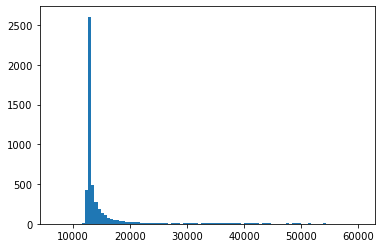

In [70]:
_ = plt.hist(intensities, bins=100)
plt.show() 

In [71]:
(np.min(np.array(intensities))*0.25 + np.mean(np.array(intensities))*0.75)

13108.812037495689

In [73]:
len([i for i in intensities if i<threshold])

2907

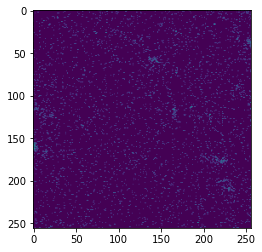

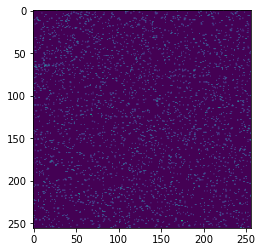

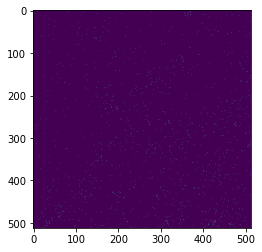

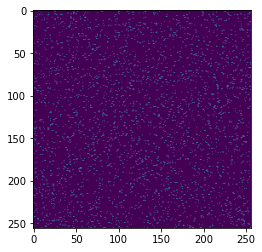

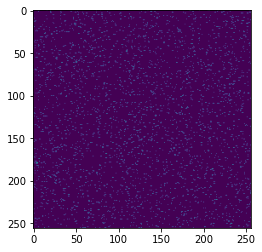

...

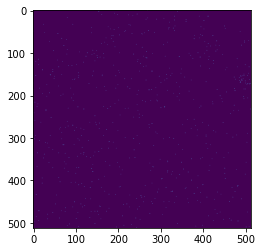

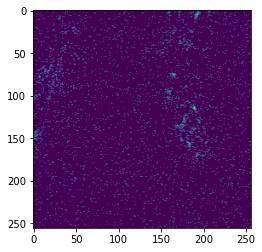

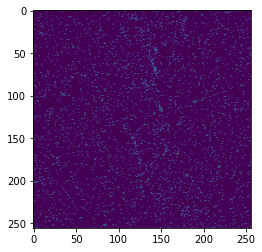

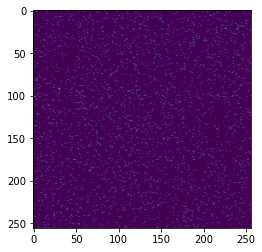

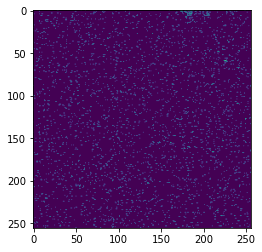

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [19]:
for fname in sampled:
    arr = io.imread(fname)
    mask = arr > (threshold_otsu(arr))
    arr = arr * mask
    intensity = np.sum(arr) / np.count_nonzero(mask)
    if intensity < 15000:
        plt.imshow(arr)
        plt.show()

In [2]:
fnames = glob('datasets/PA_2081b_part2/target/*.tif') + glob('datasets/PA_2081b_part2/input/*.tif')
exclude_list = screen_background(fnames)

100%|██████████| 59280/59280 [11:26<00:00, 86.31it/s] 


In [5]:
remove_name_list = list(set([os.path.basename(i) for i in exclude_list]))
file_dirs = [i for i in fnames if os.path.basename(i) not in remove_name_list]

In [8]:
len(fnames) - len(file_dirs)

34750

In [9]:
len(remove_name_list)*2

34750

In [10]:
fnames_t = glob('datasets/PA_2081b_part2/target/*.tif')
file_dirs_t = [i for i in fnames_t if os.path.basename(i) not in remove_name_list]

In [11]:
fnames_i = glob('datasets/PA_2081b_part2/input/*.tif')
file_dirs_i = [i for i in fnames_i if os.path.basename(i) not in remove_name_list]

In [16]:
from skimage import filters, morphology, io, img_as_uint
from glob import glob
from tqdm import tqdm

In [ ]:
fnames = glob('datasets/PA_2081b_part2/target/*.tif')
for fname in tqdm(fnames):
    img_arr = io.imread(fname)
    img_mf = img_as_uint(filters.median(img_arr, footprint=morphology.diamond(2)))
    io.imsave(fname, img_mf)
    